# Domain Expansion Strategy

In [1]:
using Pkg
Pkg.activate("..")
using OneClassActiveLearning
using SVDD
using JuMP
using MLKernels
using Gurobi
using Plots
using Random, Serialization, Distributions, MLLabelUtils
gr(size=(600, 400))

Plots.GRBackend()

In [2]:
function Plots.plot(m::OCClassifier, ground_truth::Vector{Symbol}, prec=0, title=""; data_outliers=nothing, markersize=6, legendfontsize=12)
    r_x = range(-0.1, 1.1, length = 100)
    r_y = range(-0.1, 1.1, length = 100)
    grid = hcat([[x,y] for x in r_x for y in r_y]...)
    grid_predictions = SVDD.predict(m, grid)
    predictions = SVDD.predict(m, m.data)
    data = m.data
    grid_p = grid_predictions .- prec
    p = contourf(r_x, r_y, reshape(grid_p , length(r_x), length(r_x)), levels=range(0, maximum(grid_predictions), length=20), legend=true, color=:grays, markersize=markersize, legendfontsize=legendfontsize, grid=false, cbar=false, linewidth=0, axis=false)
    out = ground_truth .== :outlier
    scatter!(data[1, .!out], data[2, .!out], color=:white, marker=:circle, markersize=markersize, label="Inlier")
    scatter!(data[1, out], data[2, out], color=:red, marker=:square, markersize=markersize, label="Outlier")
    p
end

In [3]:
plots_output = joinpath("..", "plots/des_example")
markersize, legendfontsize = 6, 20;

In [4]:
data_output_root = "../data/"
experiments = deserialize(joinpath(data_output_root, "output", "eval_part_1", "experiments.jser"));

In [5]:
data_file = joinpath(data_output_root, "output", "eval_part_1", "data", "gmm_holdout_4_seed_2_dim_3_gaussians_1_num_gaussians_train.csv")

"../data/output/eval_part_1/data/gmm_holdout_4_seed_2_dim_3_gaussians_1_num_gaussians_train.csv"

In [6]:
data, labels = load_data(data_file)

([0.294107 0.313394 … 0.786382 0.579101; 0.541654 0.537561 … 0.761274 0.848348], Symbol[:inlier, :inlier, :inlier, :inlier, :inlier, :inlier, :inlier, :inlier, :inlier, :inlier  …  :outlier, :outlier, :outlier, :outlier, :outlier, :outlier, :outlier, :outlier, :outlier, :outlier])

In [7]:
e = first(e for e in experiments if occursin(basename(data_file), e[:data_file]))
pools = deepcopy(e[:param][:initial_pools]);

Visualize real data and initial sample.

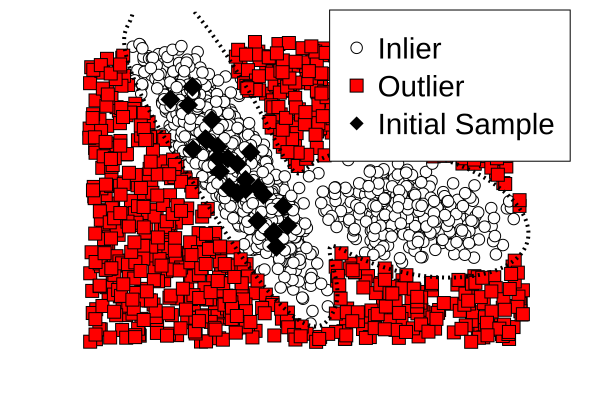

In [8]:
p = scatter(data[1, labels .== :inlier], data[2, labels .== :inlier], color=:white, marker=:circle, markersize=markersize, label="Inlier", legendfontsize=legendfontsize, legend=:topright, grid=false, axis=false)
scatter!(data[1, labels .== :outlier], data[2, labels .== :outlier], color=:red, marker=:square, markersize=markersize, label="Outlier")
scatter!(data[1, pools .== :Lin], data[2, pools .== :Lin], color=:black, marker=:diamond, markersize=markersize * 1.5, label="Initial Sample")
xlims!((-0.1, 1.15))
ylims!((-0.1, 1.1))
r_x = range(-0.1, 1.15, length = 250)
r_y = range(-0.1, 1.1, length = 250)
grid = hcat([[x,y] for x in r_x for y in r_y]...)
pred_oracle = Distributions.pdf(Distributions.MixtureModel(e[:oracle].gmm), grid)
contour!(r_x, r_y, reshape(pred_oracle , length(r_x), length(r_x)), levels=[e[:oracle].threshold], color=:black, linewidth=4, linestyle=:dot, cbar=false)
savefig(p, joinpath(plots_output, "des_init.png"))
p

In [9]:
solver = with_optimizer(Gurobi.Optimizer; OutputFlag=0, Threads=1)
init_strategy = WangCombinedInitializationStrategy(solver, 2.0.^range(-4, stop=4, step=1.0), FixedCStrategy(1.0))
train_data, train_pools = data[:, pools .== :Lin], pools[pools .== :Lin]
model = SVDD.SVDDneg(train_data, train_pools)
Random.seed!(0)
SVDD.initialize!(model, init_strategy)
SVDD.set_adjust_K!(model, true)
SVDD.fit!(model, solver);

[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 4.218847493575595e-15. The sum of adjustments is 5.678790770957676e-13
Academic license - for non-commercial use only
Academic license - for non-commercial use only
[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 3.4416913763379853e-15. The sum of adjustments is 6.469269564490787e-13
Academic license - for non-commercial use only
Academic license - for non-commercial use only
[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 3.9968028886505635e-15. The sum of adjustments is 1.1824985435282542e-12
Academic license - for non-commercial use only
Academic license - for non-commercial use only
[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 3.4416913763379853e-15. The sum of adjustm

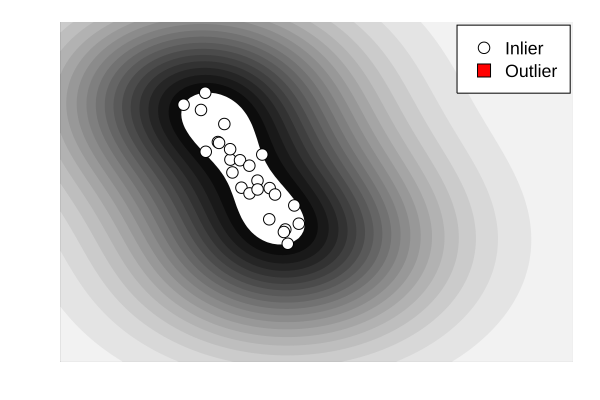

In [10]:
p = Plots.plot(model, labels[pools .== :Lin])

Set up active learning.

In [11]:
oracle = e[:oracle]
ground_truth = labels[pools .== :Lin]
optimizer = BlackBoxOptimization(:dxnes, eps=1.0)
qs = ExplorativeMarginQss(model, train_data; solver=solver, optimizer=optimizer);

In [12]:
function iterate(ground_truth, oracle, train_data, train_pools, model, solver, qs, prec=0; title="", data_outliers=nothing, markersize=markersize, legendfontsize=legendfontsize)
    SVDD.set_pools!(model, train_pools)
    SVDD.set_data!(model, train_data)
    SVDD.invalidate_solution!(model)
    
    SVDD.set_adjust_K!(model, true)
    SVDD.fit!(model, solver)
    data_pools = labelmap2vec(model.pools)
    qs_score_f = OneClassActiveLearning.QueryStrategies.QuerySynthesisStrategies.qs_score_function(qs, model.data, labelmap(data_pools))
    Random.seed!(42)
    query = OneClassActiveLearning.get_query_objects_helper(qs, train_data, train_pools, collect(1:size(train_data,2)))
    
    r_x = range(-0.1, 1.15, length = 250)
    r_y = range(-0.1, 1.1, length = 250)
    grid = hcat([[x,y] for x in r_x for y in r_y]...)
    qs_scores = qs_score_f(grid)
    grid_predictions = SVDD.predict(model, grid)
    predictions = SVDD.predict(model, model.data)
    data = model.data
    grid_p = grid_predictions .- prec
                    
    #normalize qs_scores for plotting
    g = qs_scores
    if (length(train_pools) > 28)
        for _ in 1:2
            g = (g .- minimum(g)) / (maximum(g) - minimum(g))
            g = exp.(exp.(g))
        end
    end
    p = contour(r_x, r_y, reshape(g , length(r_x), length(r_x)), levels=range(minimum(g), maximum(g), length=20), legend=true, color=:heat, markersize=markersize, legendfontsize=legendfontsize, grid=false, fill=true, axis=false, linewidth=0)
    out = ground_truth .== :outlier
    scatter!(data[1, .!out], data[2, .!out], color=:white, marker=:circle, markersize=markersize, label="Inlier")
    scatter!(data[1, out], data[2, out], color=:red, marker=:square, markersize=markersize, label="Outlier")
    contour!(r_x, r_y, reshape(grid_p , length(r_x), length(r_x)), levels=[0], color=:black, linewidth=5, cbar=false)
    scatter!(query[1, :], query[2, :], color=:black, marker=:star, markersize=markersize*2, label="Query")
    
    pred_oracle = Distributions.pdf(Distributions.MixtureModel(oracle.gmm), grid)
    contour!(r_x, r_y, reshape(pred_oracle , length(r_x), length(r_x)), levels=[oracle.threshold], color=:black, linewidth=4, linestyle=:dot, cbar=false)

    train_data, train_pools = hcat(train_data, query), vcat(train_pools, first(ask_oracle(oracle, query)) == :inlier ? :Lin : :Lout)
    ground_truth = vcat(ground_truth, ask_oracle(oracle, query))                
    (ground_truth, oracle, train_data, train_pools, model, solver, qs), p
end

iterate (generic function with 2 methods)

Run active learning.

In [13]:
qs_plots = []
for i in 1:15
    (ground_truth, oracle, train_data, train_pools, model, solver, qs), p = iterate(ground_truth, oracle, train_data, train_pools, model, solver, qs)
    savefig(p, joinpath(plots_output, "des_$(i).png"))
    push!(qs_plots, p)
end 

Academic license - for non-commercial use only
Academic license - for non-commercial use only
[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 2.4424906541753444e-15. The sum of adjustments is 4.702488398677929e-13
[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 5.9396931817445875e-15. The sum of adjustments is 1.059929921609637e-12
[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 4.107825191113079e-15. The sum of adjustments is 9.24996190754257e-13
[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 3.774758283725532e-15. The sum of adjustments is 7.574635363383209e-13
[info | SVDD]: Adjusting Kernel Matrix.
[info | SVDD]: [ADJUST KERNEL] Maximum adjustemt of kernel matrix entry is 3.774758283725532e-15. The sum of adjustments 

In [14]:
plot(qs_plots..., layout=(length(qs_plots), 1), size=(600, 400*length(qs_plots)), legend=false)